# Semantic Segmentation


1.Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>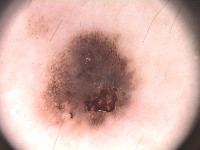</td><td>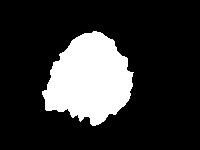</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем сегментировать их.

In [0]:
# https://www.dropbox.com/s/buersqjuvruvf2w/PH2Dataset.rar

In [2]:
! wget https://www.dropbox.com/s/buersqjuvruvf2w/PH2Dataset.rar

--2020-06-05 15:46:45--  https://www.dropbox.com/s/buersqjuvruvf2w/PH2Dataset.rar
Resolving www.dropbox.com (www.dropbox.com)... 162.125.82.1, 2620:100:6032:1::a27d:5201
Connecting to www.dropbox.com (www.dropbox.com)|162.125.82.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/buersqjuvruvf2w/PH2Dataset.rar [following]
--2020-06-05 15:46:46--  https://www.dropbox.com/s/raw/buersqjuvruvf2w/PH2Dataset.rar
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc0e187c8e013bfce3fa7634ced2.dl.dropboxusercontent.com/cd/0/inline/A5GR0eOxWncjHHI0LgbN6Hw1drli2JwLKiGFV9T27cXuUxxPNn8tbXq9WaCnMmI4N9W4o845_FnoNhUyu8Mj1A82ibzpTm48qmLXw72h6aEEqPt_C2N8PJv9MdY-pAEGlZY/file# [following]
--2020-06-05 15:46:47--  https://uc0e187c8e013bfce3fa7634ced2.dl.dropboxusercontent.com/cd/0/inline/A5GR0eOxWncjHHI0LgbN6Hw1drli2JwLKiGFV9T27cXuUxxPNn8tbXq9WaCnMmI4N9W4o845_FnoNhUyu8Mj1A82ibzpTm48qmLXw72h6

In [0]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

Для загрузки датасета я предлагаю использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [0]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize) можно использовать для изменения размера изображений. 
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [0]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [6]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


In [7]:
len(lesions)

200

In [8]:
X[0].shape

(256, 256, 3)

Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

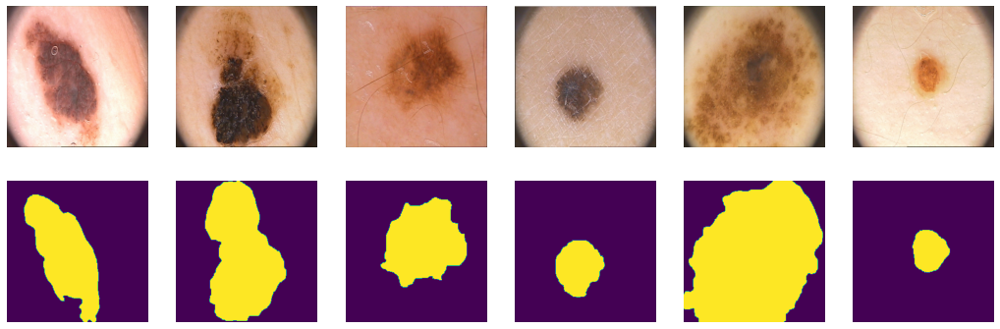

In [9]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для валидации и теста

In [0]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [11]:
print(len(tr), len(val), len(ts))

100 50 50


In [12]:
ix

array([ 46,  77,  54, 165, 125,  23,   9,  62,  39,  33,  41,  66,  53,
       175,  31,  65,  90,  82,   8,  16,  91,  81, 147, 107, 149, 170,
        52, 164,  61, 153,  15,  55,  51,  35, 135,  11,   2, 143, 118,
       100, 122, 158,  92, 131, 157, 137, 106,   4, 186, 101, 111,  43,
       128,  17, 121,   3,  38, 193,  36,  79,  37, 185, 178,  70,  50,
        83, 108, 150, 133, 109, 179, 110, 145, 140, 117, 138,  10,  59,
       189, 174,  97,  78, 163, 199, 144,  96, 181, 168, 182, 187,  94,
       116, 151, 127,  63, 183, 196,  85, 139,  44, 173,  30,  75, 154,
       104,  24, 160, 141,  80,  56, 126, 167, 162, 103,  87,   0, 136,
       152, 180,  64, 115,  48,  98, 148,  42, 132, 146, 113, 176, 161,
       198,  72,  29, 197,  69,  47,  26,   7,  19,  20, 169,  99,  12,
        86,  58,   5,  71,  95,  45, 194, 172,  22,  40, 112, 134, 188,
       142,  84, 123,   6,  60,  25,  18, 119, 124, 195,   1, 166, 120,
       130,  68,  34, 155, 114,  32,  57,  89, 129,  27,  74, 19

#### PyTorch DataLoader

In [0]:
from torch.utils.data import DataLoader
batch_size = 12
data_tr = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])), 
                     batch_size=batch_size, shuffle=True)
data_val = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
data_ts = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [14]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Реализация различных архитектур:
Ваше задание будет состоять в том, чтобы написать несколько нейросетевых архитектур для решения задачи семантической сегментации. Сравнить их по качеству на тесте и испробовать различные лосс функции для них.

-----------------------------------------------------------------------------------------

# SegNet [2 балла]

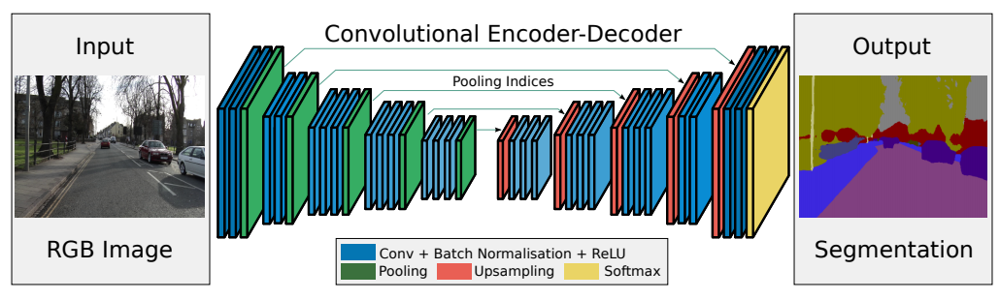

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

In [0]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [0]:
torch.manual_seed(42) 
np.random.seed(42)
torch.cuda.manual_seed(42)
torch.backends.cudnn.determenistic = True

## Метрика

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


To clarify this we can see on the segmentation:
![alt text](https://www.jeremyjordan.me/content/images/2018/05/target_prediction.png)


And the intersection will be the following:

![alt text](https://www.jeremyjordan.me/content/images/2018/05/intersection_union.png)

## функция лосса [1 балл]

Теперь не менее важным, чем построение архитектуры, является определение **оптимизатора** и **функции потерь.**

Функция потерь - это то, что мы пытаемся минимизировать. Многие из них могут быть использованы для задачи бинарной семантической сегментации. 

Популярным методом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits) в Тарая функция эквивалентна и не так подвержена численной неустойчивости.

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

In [0]:
def bce_loss(y_real, y_pred):
    return (y_pred - y_real * y_pred + torch.log(1+torch.exp(-y_pred))).mean()
    # TODO 
    # please don't use nn.BCELoss. write it from scratch

In [0]:
class SegNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0_1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_1 = nn.BatchNorm2d(64)
        self.enc_conv0_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_2 = nn.BatchNorm2d(64)
        self.pool = nn.MaxPool2d(kernel_size=2,return_indices=True)  # 256 -> 128

        self.enc_conv1_1 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_1 = nn.BatchNorm2d(128)
        self.enc_conv1_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_2 = nn.BatchNorm2d(128)

        self.enc_conv2_1 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_1 = nn.BatchNorm2d(256)
        self.enc_conv2_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_2 = nn.BatchNorm2d(256)
        self.enc_conv2_3 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_3 = nn.BatchNorm2d(256)

        
        self.enc_conv3_1 = nn.Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_1 = nn.BatchNorm2d(512)
        self.enc_conv3_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_2 = nn.BatchNorm2d(512)
        self.enc_conv3_3 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_3 = nn.BatchNorm2d(512)     
        

        # bottleneck
        self.bottleneck_conv = nn.Conv2d(512, 512, kernel_size=(1, 1), stride=(1, 1))
        self.bottleneck_bn = nn.BatchNorm2d(512)
        # decoder (upsampling)
        self.upsample = nn.MaxUnpool2d(2)
        
        self.dec_conv0_1 = nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_1 = nn.BatchNorm2d(256)
        self.dec_conv0_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_2 = nn.BatchNorm2d(256)
        self.dec_conv0_3 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_3 = nn.BatchNorm2d(256)

        
        self.dec_conv1_1 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_1 = nn.BatchNorm2d(128)
        self.dec_conv1_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_2 = nn.BatchNorm2d(128)
        self.dec_conv1_3 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_3 = nn.BatchNorm2d(128)

        
        self.dec_conv2_1 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_1 = nn.BatchNorm2d(64)
        self.dec_conv2_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_2 = nn.BatchNorm2d(64)
        self.dec_conv2_3 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_3 = nn.BatchNorm2d(64)

        
        self.dec_conv3_1 = nn.Conv2d(64, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_1 = nn.BatchNorm2d(32)
        self.dec_conv3_2 = nn.Conv2d(32, 1, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        
        
        

    def forward(self, x):
        # encoder
        e0,indices0 = self.pool(F.relu(self.bn0_2(self.enc_conv0_2(F.relu(self.bn0_1(self.enc_conv0_1(x)))))))
        e1,indices1 = self.pool(F.relu(self.bn1_2(self.enc_conv1_2(F.relu(self.bn1_1(self.enc_conv1_1(e0)))))))
        e2,indices2 = self.pool(F.relu(self.bn2_3(self.enc_conv2_3(F.relu(self.bn2_2(self.enc_conv2_2(F.relu(self.bn2_1(self.enc_conv2_1(e1))))))))))
        e3,indices3 = self.pool(F.relu(self.bn3_3(self.enc_conv3_3(F.relu(self.bn3_2(self.enc_conv3_2(F.relu(self.bn3_1(self.enc_conv3_1(e2))))))))))
        
        # bottleneck
        b = F.relu(self.bottleneck_bn(self.bottleneck_conv(e3)))
        
        # decoder
        d0 = F.relu(self.dec_bn0_3(self.dec_conv0_3(F.relu(self.dec_bn0_2(
            self.dec_conv0_2(F.relu(self.dec_bn0_1(
                self.dec_conv0_1(self.upsample(b,indices3))))))))))
        
        d1 = F.relu(self.dec_bn1_3(self.dec_conv1_3(F.relu(self.dec_bn1_2(
            self.dec_conv1_2(F.relu(self.dec_bn1_1(
                self.dec_conv1_1(self.upsample(d0,indices2))))))))))
        
        d2 = F.relu(self.dec_bn2_3(self.dec_conv2_3(F.relu(self.dec_bn2_2(
            self.dec_conv2_2(F.relu(self.dec_bn2_1(
                self.dec_conv2_1(self.upsample(d1,indices1)))))))))) 
        
        d3 = self.dec_conv3_2(F.relu(self.dec_bn3_1(
                self.dec_conv3_1(self.upsample(d2,indices0))))) 
          
        #d4 = self.dec_conv4_2(F.relu(self.dec_bn4_1(
                #self.dec_conv4_1(self.upsample(d3,indices0))))) 
                            
        # no activation
        return d3

## Тренировка [1 балл]

Мы определим цикл обучения в функции, чтобы мы могли повторно использовать его.

In [0]:
def train(model, opt, loss_fn, epochs, data_tr, data_val, data_ts, sched):
    
    train_log = []
    val_log = []
    test_log = []
    val_metric = []
    test_metric = []

    for epoch in range(epochs):
        tic = time()
        print('* Epoch %d/%d' % (epoch+1, epochs)) 

        avg_loss = 0
        val_loss = 0
        test_loss = 0
        model.train()  # train mode
        for X_batch, Y_batch in data_tr:
            # data to device
            X_batch = X_batch.to(device)
            Y_batch = Y_batch.to(device)
            # set parameter gradients to zero
            opt.zero_grad()
            # forward
            Y_pred = model(X_batch)
            loss = loss_fn(Y_batch,Y_pred) # forward-pass
            loss.backward()  # backward-pass
            opt.step()  # update weights
            # calculate loss to show the user
            avg_loss += loss / len(data_tr)
        toc = time()
        print('loss: %f' % avg_loss)
        # show intermediate results
        model.eval()  # testing mode
        for X_val, Y_val in data_val:
          with torch.no_grad():
            Y_hat = model(X_val.to(device)).cpu()
            val_loss += loss_fn(Y_val,Y_hat)/len(data_val)
        for X_test, Y_test in data_ts:
          with torch.no_grad():
            Y_hat = model(X_test.to(device)).cpu()
            test_loss += loss_fn(Y_test,Y_hat)/len(data_ts)
          #with torch.no_grad():
        #  Y_hat = model(X_val.to(device)).cpu()# detach and put into cpu
        #  val_loss = loss_fn(Y_val,Y_hat)
          # Visualize tools
        

        sched.step(avg_loss)  
        
        train_log.append(avg_loss)
        val_log.append(val_loss)
        test_log.append(test_loss)
        val_metric.append(score_model(model, iou_pytorch, data_val))
        test_metric.append(score_model(model, iou_pytorch, data_ts))
        
        
        
        X_val, Y_val = next(iter(data_val))
        with torch.no_grad():
            Y_hat = model(X_val.to(device)).cpu()
        clear_output(wait=True)
        for k in range(6):
            plt.subplot(2, 6, k+1)
            plt.imshow(np.rollaxis(X_val[k].numpy(), 0, 3), cmap='gray')
            plt.title('Real')
            plt.axis('off')

            plt.subplot(2, 6, k+7)
            plt.imshow(Y_hat[k, 0]>0.5, cmap='gray')
            plt.title('Output')
            plt.axis('off')
        plt.suptitle('%d / %d - val loss: %f train loss: %f' % (epoch+1, epochs, val_loss, avg_loss))
        plt.show()
    return train_log, val_log, test_log, val_metric, test_metric

## Инференс [1 балл]

После обучения модели эту функцию можно использовать для прогнозирования сегментации на новых данных:

In [0]:
def iou_pytorch(outputs: torch.Tensor, labels: torch.Tensor):
    # You can comment out this line if you are passing tensors of equal shape
    # But if you are passing output from UNet or something it will most probably
    # be with the BATCH x 1 x H x W shape
    outputs = outputs.squeeze(1).byte()  # BATCH x 1 x H x W => BATCH x H x W
    labels = labels.squeeze(1).byte()
    SMOOTH = 1e-8
    intersection = (outputs & labels).float().sum((1, 2))  # Will be zero if Truth=0 or Prediction=0
    union = (outputs | labels).float().sum((1, 2))         # Will be zzero if both are 0
    
    iou = (intersection + SMOOTH) / (union + SMOOTH)  # We smooth our devision to avoid 0/0
    
    thresholded = torch.clamp(20 * (iou - 0.5), 0, 10).ceil() / 10  # This is equal to comparing with thresolds
    
    return thresholded  # 

In [0]:
def predict(model, data):
    model.eval()  # testing mode
    Y_pred = [model(X_batch.to(device)) for X_batch, _ in data]
    return np.array(Y_pred)

In [0]:
def score_model(model, metric, data):
    model.eval()  # testing mode
    scores = 0
    for X_batch, Y_label in data:
        Y_pred = model(X_batch.to(device))
        scores += metric(Y_pred>0, Y_label.to(device)).mean().item()

    return scores/len(data)

## SegNet, BCE, batchsize = 8

In [0]:
model = SegNet().to(device)

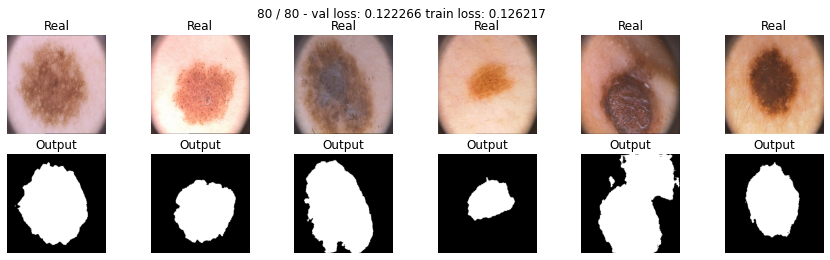

In [0]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_bce = train(model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

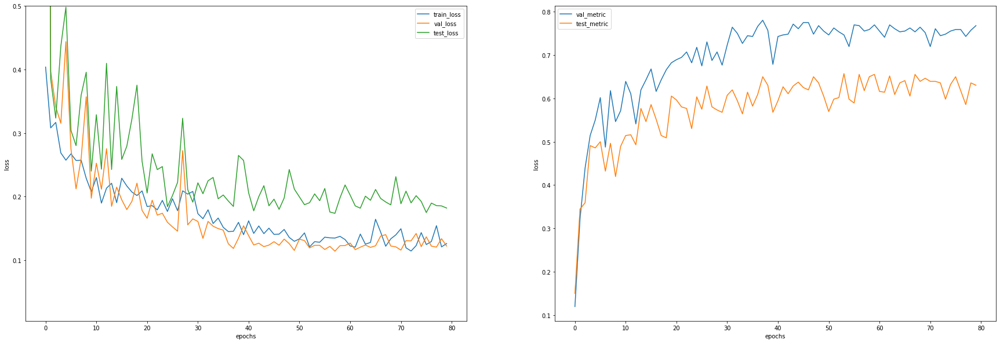

In [0]:
tr, val, test, valm, testm = seg_bce[0],seg_bce[1],seg_bce[2],seg_bce[3],seg_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [0]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.780357, max test_metric: 0.657143


## SegNet, BCE, batchsize = 12

In [0]:
model = SegNet().to(device)

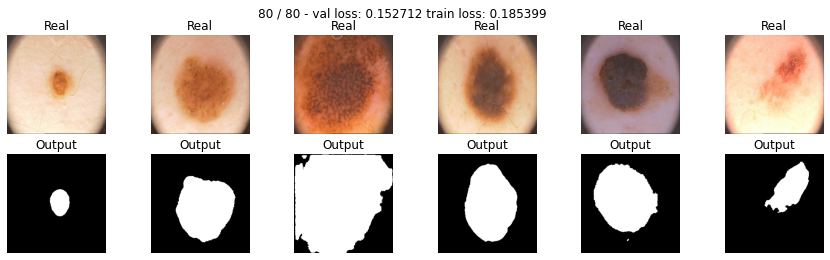

In [24]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_bce = train(model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

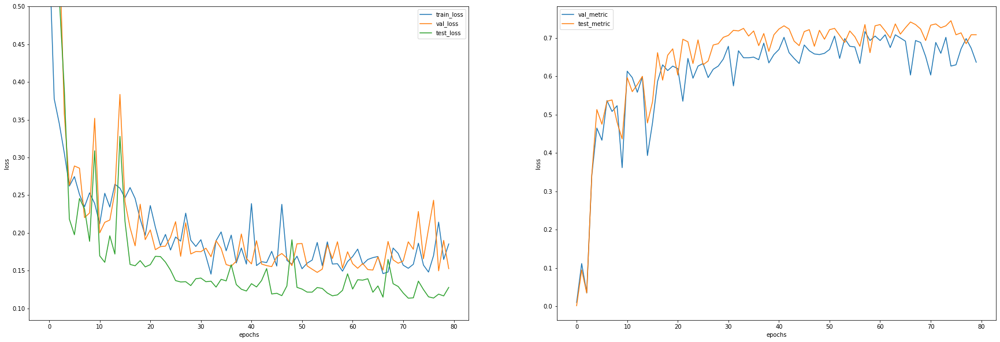

In [26]:
tr, val, test, valm, testm = seg_bce[0],seg_bce[1],seg_bce[2],seg_bce[3],seg_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.716667, max test_metric: 0.745000


-----------------------------------------------------------------------------------------

Дополнительные функции лосса [2 балла] 

 В данном разделе вам потребуется имплементировать две функции потерь:
 DICE и Focal loss.


**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1-\frac{1}{256 \times 256} \times \sum_i\frac{2X_iY_i}{X_i+Y_i}.$$

//  Не забудьте подумать о численной нестабильности.


In [0]:
def dice_loss(y_real, y_pred,eps = 1e-8):
    y_pred = torch.sigmoid(y_pred)
    num = 2*torch.sum((y_real*y_pred),dim=(1,2,3))
    den =  torch.sum((y_real+y_pred),dim=(1,2,3))
    res = (1 - num / (den + eps)).mean()
    return res 

Проводим тестирование:

SegNet, Dice, batchsize = 8

> SegNet, Dice, batchsize = 8



## SegNet, Dice, batchsize = 8

In [0]:
model = SegNet().to(device)

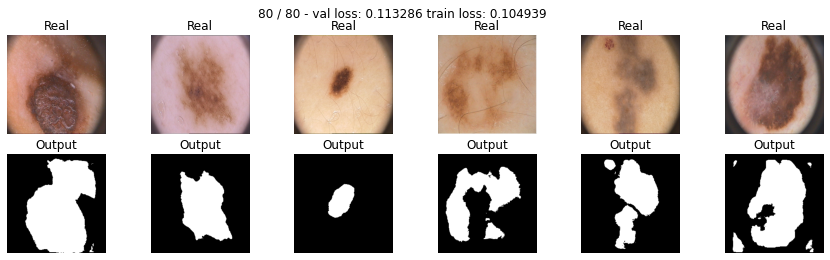

In [25]:
max_epochs = 80
optim = torch.optim.Adam(model_dice.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_dice1 = train(model_dice, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

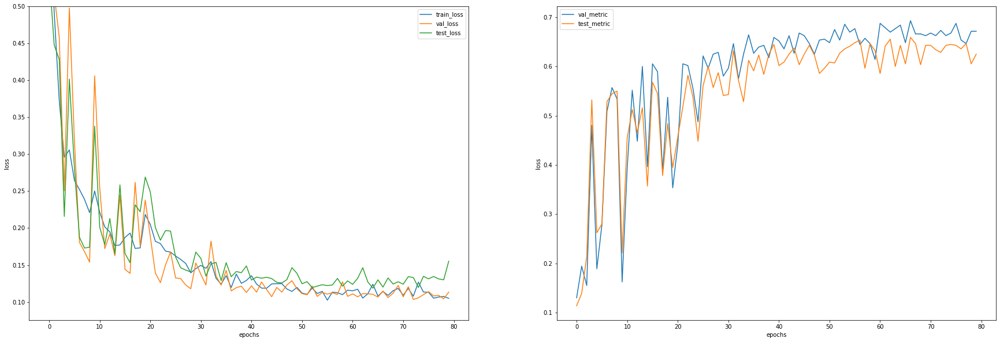

In [26]:
tr, val, test, valm, testm = seg_dice1[0],seg_dice1[1],seg_dice1[2],seg_dice1[3],seg_dice1[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.692857, max test_metric: 0.658929


## SegNet, Dice, batchsize = 12

In [0]:
model = SegNet().to(device)

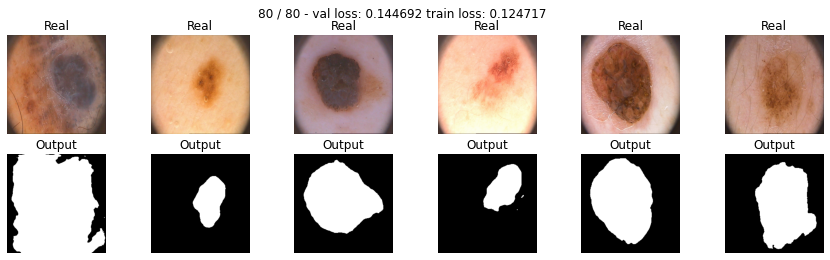

In [32]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_dice1 = train(model, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

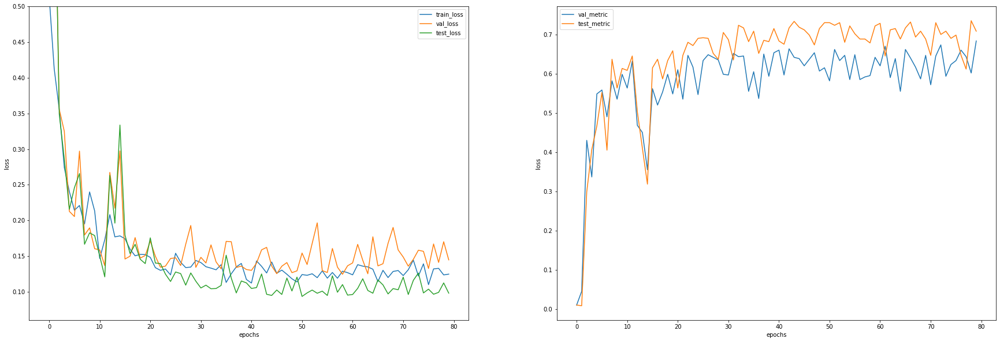

In [33]:
tr, val, test, valm, testm = seg_dice1[0],seg_dice1[1],seg_dice1[2],seg_dice1[3],seg_dice1[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [34]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.683333, max test_metric: 0.735000


[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf) 

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.

Еще одним недавним дополнением является взвешенный пиксельный вариант, которая взвешивает каждый пиксель по степени уверенности, которую мы имеем в предсказании этого пикселя.

$$\mathcal L_{focal}(y, \hat y) = -\sum_i \left[\left(1-\sigma(\hat y_i)\right)^\gamma y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Зафиксируем значение $\gamma=2$.

--------------------------------------------------------------------------------


In [0]:
def focal_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
  y_pred = torch.sigmoid(y_pred)
  pt = y_real*y_pred+(1-y_real)*(1-y_pred)
  return (-1*((1-pt)**gamma)*torch.log(pt+eps)).mean()


## SegNet, Focal, batchsize=8

In [0]:
model_focal = SegNeat().to(device)

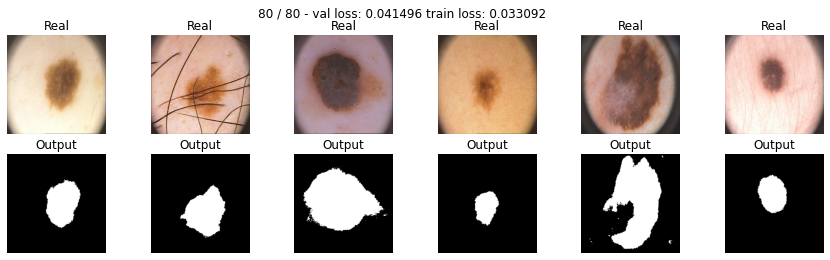

In [0]:
max_epochs = 80
optim = torch.optim.Adam(model_focal.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_focal = train(model_focal, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

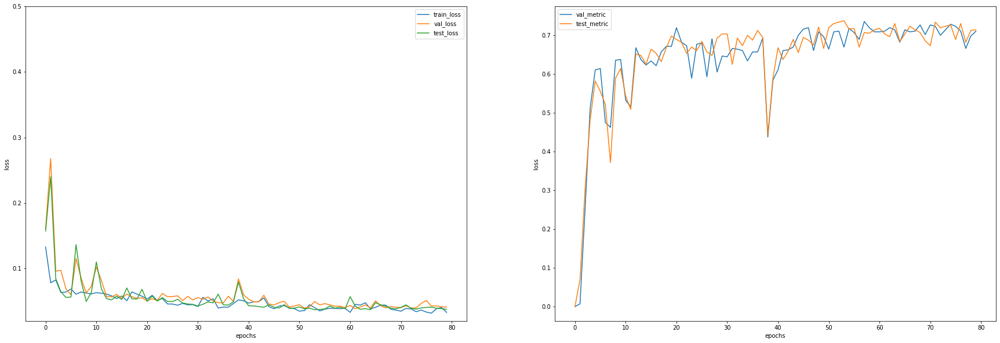

In [0]:
tr, val, test, valm, testm = seg_focal[0],seg_focal[1],seg_focal[2],seg_focal[3],seg_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [0]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.735714, max test_metric: 0.737500


## SegNet, Focal, batchsize=12

In [0]:
model = SegNet().to(device)

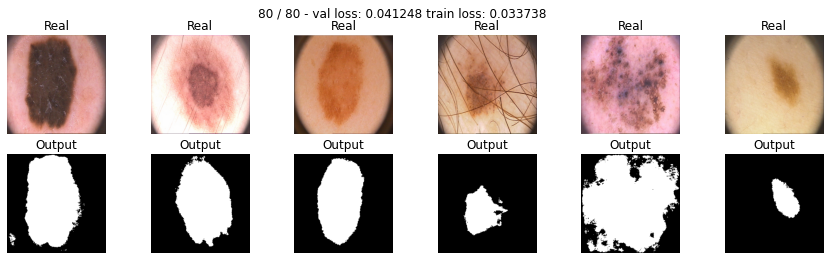

In [25]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_focal = train(model, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

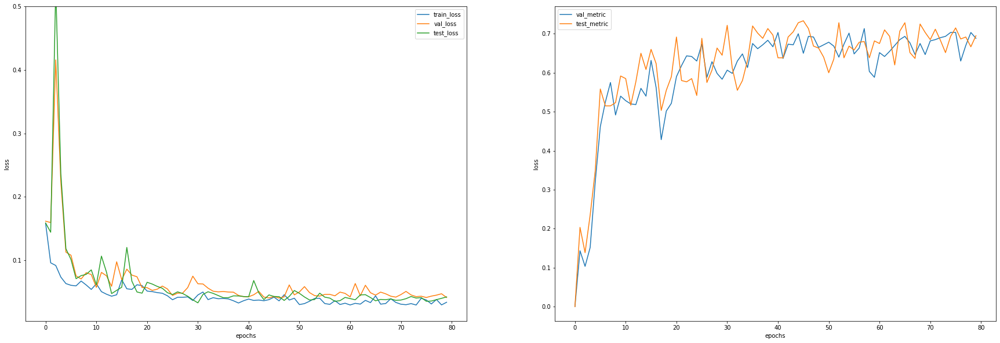

In [26]:
tr, val, test, valm, testm = seg_focal[0],seg_focal[1],seg_focal[2],seg_focal[3],seg_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.713333, max test_metric: 0.733333


----------------------------------------------------------------------------------------------

[BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаю написать вам 1 функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее. Кроме тако провести численное сравнение с предыдущими функциями.
Какие варианты? 

1) Можно учесть Total Variation
2) Lova
3) BCE но с Soft Targets (что-то типа label-smoothing для многослассовой классификации)
4) Tversky loss
5) Любой другой 

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

<div style="border-left: solid 6px #d6d6d6; padding: 10px; background-color: #eaeaea">
<b><i>Exercise:</i></b> Add the total variation term to the loss.</div>

## SegNet, Combo, batchsize=8

In [0]:
def combo_loss(y_real, y_pred, eps = 1e-8, gamma = 2):
  y_pred = torch.sigmoid(y_pred)
  pt = y_real*y_pred+(1-y_real)*(1-y_pred)
  focal = (-1*((1-pt)**gamma)*torch.log(pt+eps)).mean()
  num = 2*torch.sum((y_real*y_pred),dim=(1,2,3))
  den =  torch.sum((y_real+y_pred),dim=(1,2,3))
  dice = (1 - num / (den + eps)).mean()
  return focal + dice

In [0]:
model_combo = SegNet().to(device)

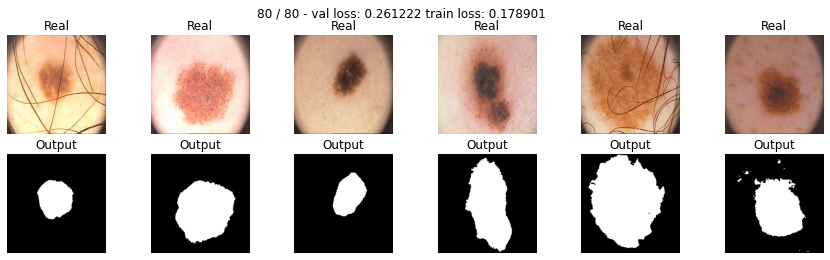

In [0]:
max_epochs = 80
optim = torch.optim.Adam(model_combo.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_combo = train(model_combo, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

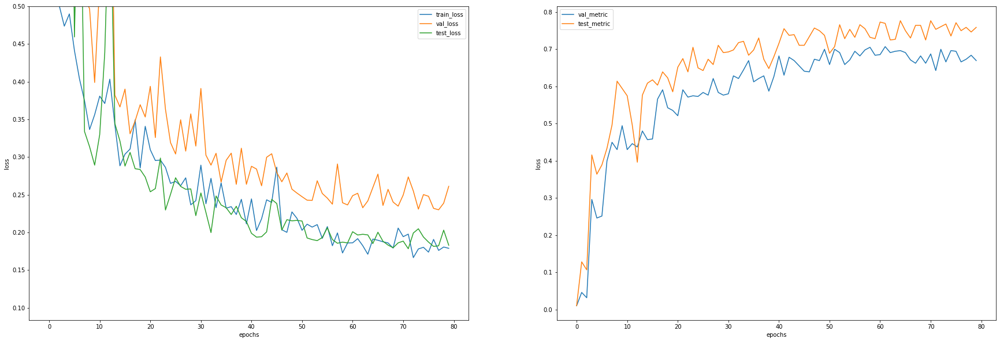

In [0]:
tr, val, test, valm, testm = seg_combo[0],seg_combo[1],seg_combo[2],seg_combo[3],seg_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [0]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.707143, max test_metric: 0.776786


## SegNet, Combo, batchsize=12

In [0]:
model = SegNet().to(device)

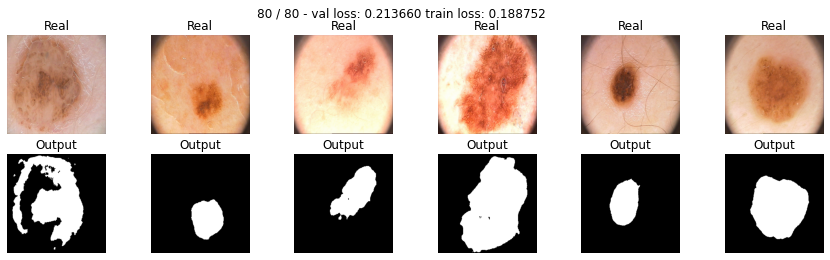

In [37]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_combo = train(model, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

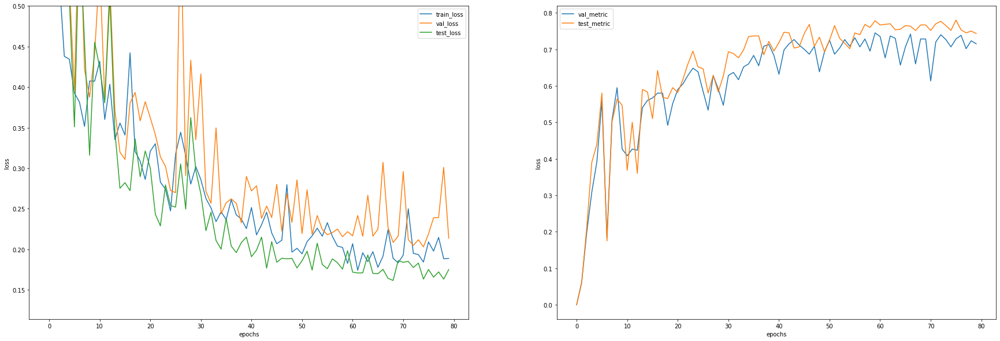

In [38]:
tr, val, test, valm, testm = seg_combo[0],seg_combo[1],seg_combo[2],seg_combo[3],seg_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [39]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.745000, max test_metric: 0.780000


## SegNet, Tversky, batchsize=8

In [0]:
def tversky_loss(y_real, y_pred, beta = 0.3):
    y_pred = torch.sigmoid(y_pred)
    num = torch.sum((y_real*y_pred),dim=-1)
    den =  torch.sum((y_real*y_pred+beta*(1-y_real)*y_pred + (1-beta)*y_real*(1 - y_pred)),dim=-1)
    res = (1 - (num + 1) / (den+1)).mean()
    return res 

In [0]:
model_tversky = SegNet().to(device)

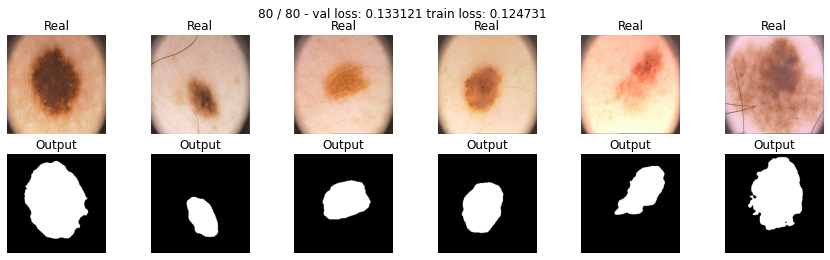

In [25]:
max_epochs = 80
optim = torch.optim.Adam(model_tversky.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_tversky = train(model_tversky, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

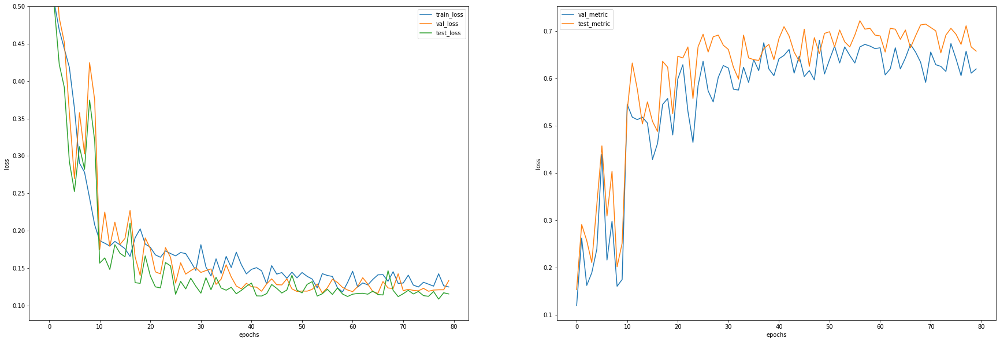

In [26]:
tr, val, test, valm, testm = seg_tversky[0],seg_tversky[1],seg_tversky[2],seg_tversky[3],seg_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.680357, max test_metric: 0.721429


## SegNet, Tversky, batchsize=12

In [0]:
model = SegNet().to(device)

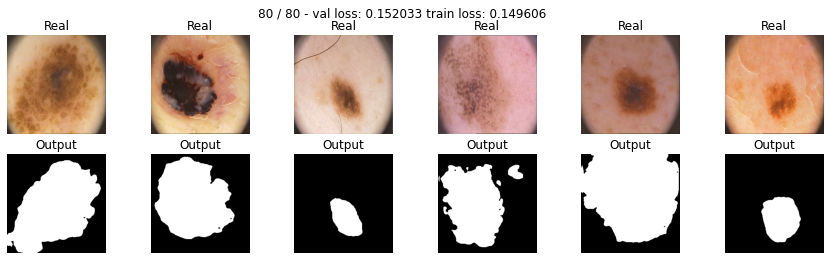

In [42]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
seg_tversky = train(model, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

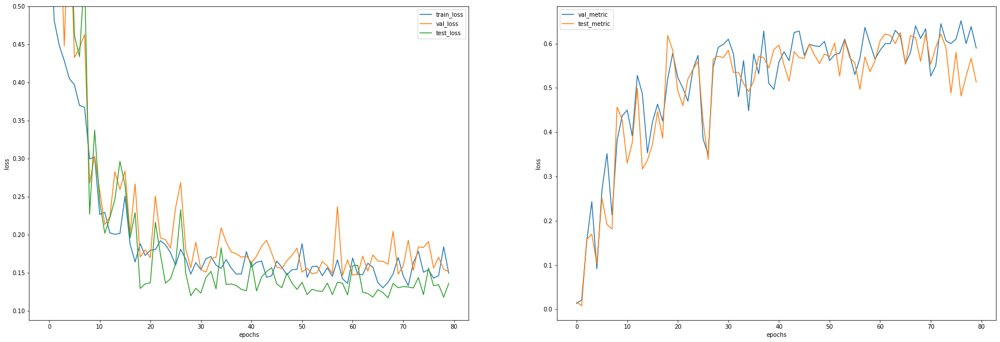

In [43]:
tr, val, test, valm, testm = seg_tversky[0],seg_tversky[1],seg_tversky[2],seg_tversky[3],seg_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [44]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.651667, max test_metric: 0.625000


-----------------------------------------------------------------------------------------

# U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Учитывая медицинское изображение, он выводит изображение в оттенках серого, представляющее вероятность того, что каждый пиксель является интересующей областью.

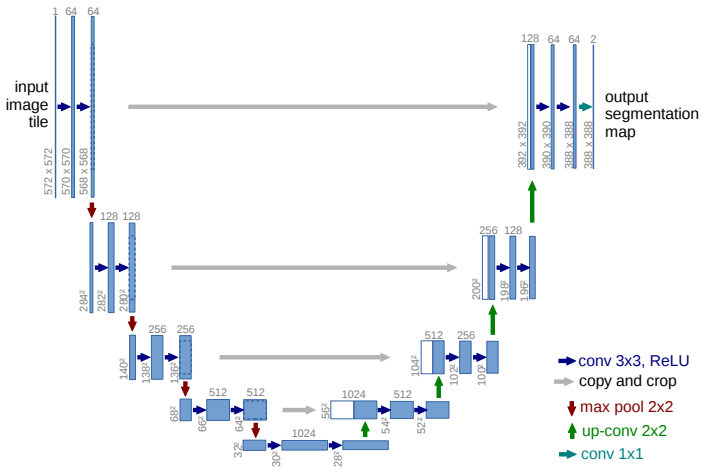

У нас в архитектуре все так же существует енкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются skip-conenctions. Элементы соединяющие части декодера и енкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [0]:
class UNet(nn.Module):
    def __init__(self):
        super().__init__()                  
        
        # encoder (downsampling)
        self.enc_conv0_1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_1 = nn.BatchNorm2d(64)
        self.enc_conv0_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_2 = nn.BatchNorm2d(64)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)  # 256 -> 128      
        
        self.enc_conv1_1 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_1 = nn.BatchNorm2d(128)
        self.enc_conv1_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_2 = nn.BatchNorm2d(128)
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) # 128 -> 64
        
        self.enc_conv2_1 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_1 = nn.BatchNorm2d(256)
        self.enc_conv2_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_2 = nn.BatchNorm2d(256)
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) # 64 -> 32

        self.enc_conv3_1 = nn.Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_1 = nn.BatchNorm2d(512)
        self.enc_conv3_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_2 = nn.BatchNorm2d(512)
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False) # 32 -> 16

        # bottleneck
        self.bottleneck_conv1 = nn.Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn1 = nn.BatchNorm2d(1024)
        self.bottleneck_conv2 = nn.Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn2 = nn.BatchNorm2d(512)

        # decoder (upsampling)
        # self.upsample0 =  # 16 -> 32
        self.dec_conv0_1 = nn.Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_1 = nn.BatchNorm2d(512)
        self.dec_conv0_2 = nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_2 = nn.BatchNorm2d(256)

        self.dec_conv1_1 = nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_1 = nn.BatchNorm2d(256)
        self.dec_conv1_2 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_2 = nn.BatchNorm2d(128)

        self.dec_conv2_1 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_1 = nn.BatchNorm2d(128)
        self.dec_conv2_2 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_2 = nn.BatchNorm2d(64)

        self.dec_conv3_1 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_1 = nn.BatchNorm2d(64)
        self.dec_conv3_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_2 = nn.BatchNorm2d(64)
        self.dec_conv3_3 = nn.Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))       

    def forward(self, x):
        # encoder
        e0_1 = F.relu(self.bn0_2(self.enc_conv0_2(F.relu(self.bn0_1(self.enc_conv0_1(x))))))
        e0_2 = self.pool(e0_1)
        e1_1 = F.relu(self.bn1_2(self.enc_conv1_2(F.relu(self.bn1_1(self.enc_conv1_1(e0_2))))))
        e1_2 = self.pool(e1_1)
        e2_1 = F.relu(self.bn2_2(self.enc_conv2_2(F.relu(self.bn2_1(self.enc_conv2_1(e1_2))))))
        e2_2 = self.pool(e2_1)
        e3_1 = F.relu(self.bn3_2(self.enc_conv3_2(F.relu(self.bn3_1(self.enc_conv3_1(e2_2))))))
        e3_2 = self.pool(e3_1)
               
        # bottleneck
        b = F.relu(self.bottleneck_bn2(self.bottleneck_conv2(F.relu(self.bottleneck_bn1(self.bottleneck_conv1(e3_2))))))            

        # decoder
        d0 = F.relu(self.dec_bn0_2(self.dec_conv0_2(F.relu(self.dec_bn0_1(self.dec_conv0_1(
            torch.cat([e3_1,(F.interpolate(b,scale_factor=2,mode='nearest'))],dim=1)))))))
        d1 = F.relu(self.dec_bn1_2(self.dec_conv1_2(F.relu(self.dec_bn1_1(self.dec_conv1_1(
            torch.cat([e2_1,(F.interpolate(d0,scale_factor=2,mode='nearest'))],dim=1)))))))
        d2 = F.relu(self.dec_bn2_2(self.dec_conv2_2(F.relu(self.dec_bn2_1(self.dec_conv2_1(
            torch.cat([e1_1,(F.interpolate(d1,scale_factor=2,mode='nearest'))],dim=1)))))))
        d3 = self.dec_conv3_3(F.relu(self.dec_bn3_2(self.dec_conv3_2(F.relu(self.dec_bn3_1(self.dec_conv3_1(
            torch.cat([e0_1,(F.interpolate(d2,scale_factor=2,mode='nearest'))],dim=1))))))))   
        
        
        # no activation
        return d3

## Unet, BCE, batchsize = 8

In [0]:
unet_model = UNet().to(device)

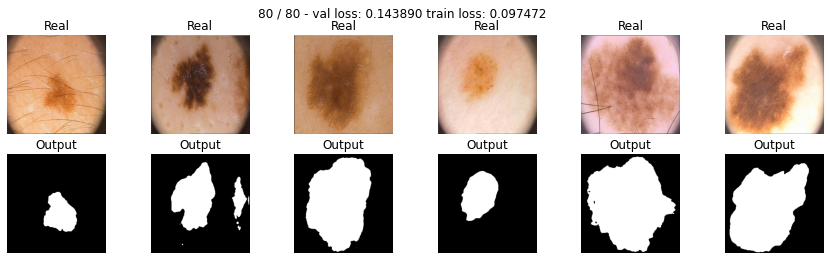

In [25]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_bce = train(unet_model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

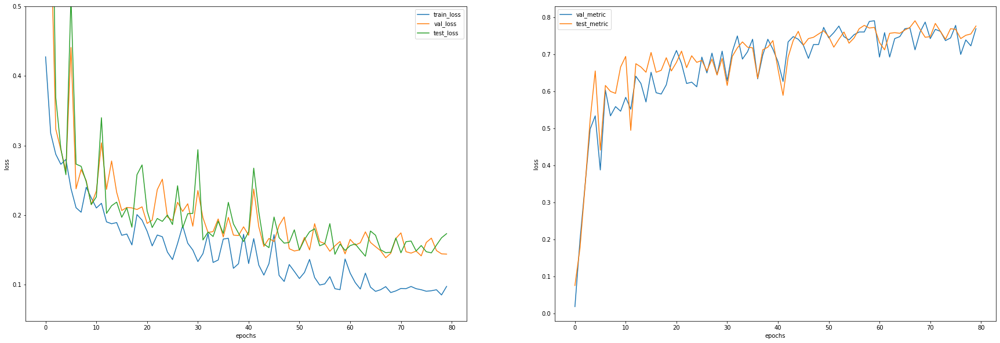

In [26]:
tr, val, test, valm, testm = unet_bce[0],unet_bce[1],unet_bce[2],unet_bce[3],unet_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.791071, max test_metric: 0.791071


## UNet, BCE, batchsize=12

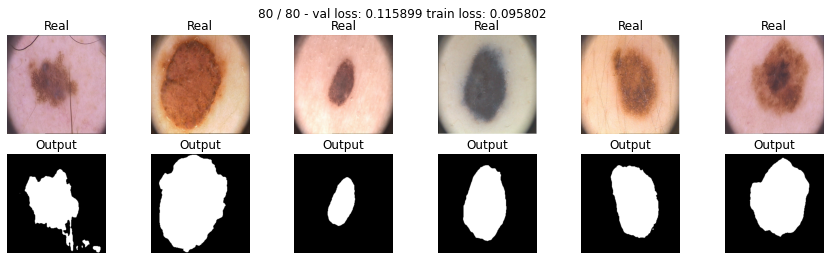

In [28]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_bce = train(unet_model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

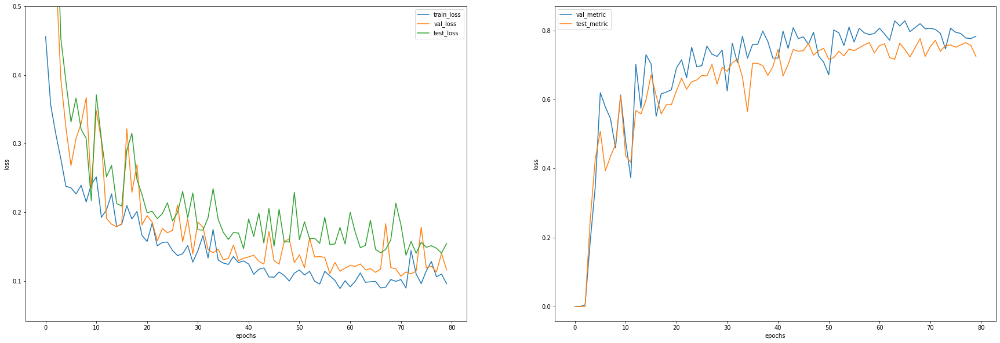

In [29]:
tr, val, test, valm, testm = unet_bce[0],unet_bce[1],unet_bce[2],unet_bce[3],unet_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [30]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.828333, max test_metric: 0.776667


## UNet, Dice, batchsize = 8

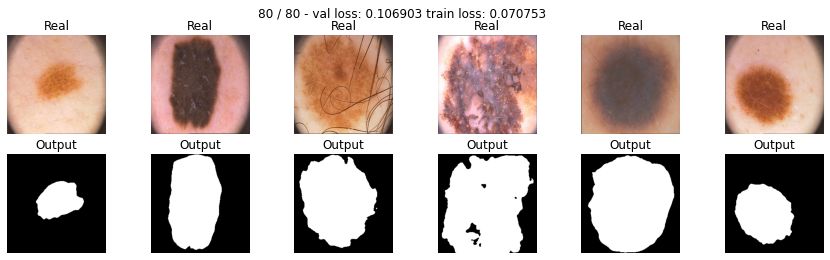

In [26]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_dice = train(unet_model, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

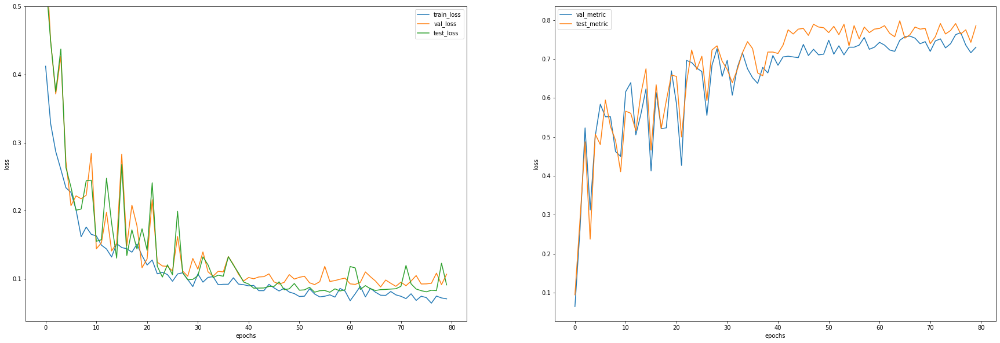

In [27]:
tr, val, test, valm, testm = unet_dice[0],unet_dice[1],unet_dice[2],unet_dice[3],unet_dice[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.767857, max test_metric: 0.798214


## UNet, Dice, batchsize = 12

In [0]:
unet_model = UNet().to(device)

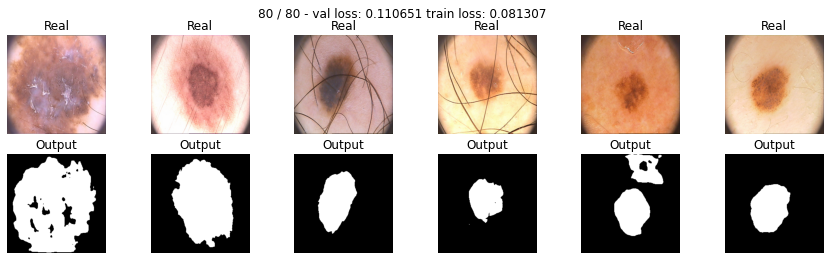

In [32]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_dice = train(unet_model, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

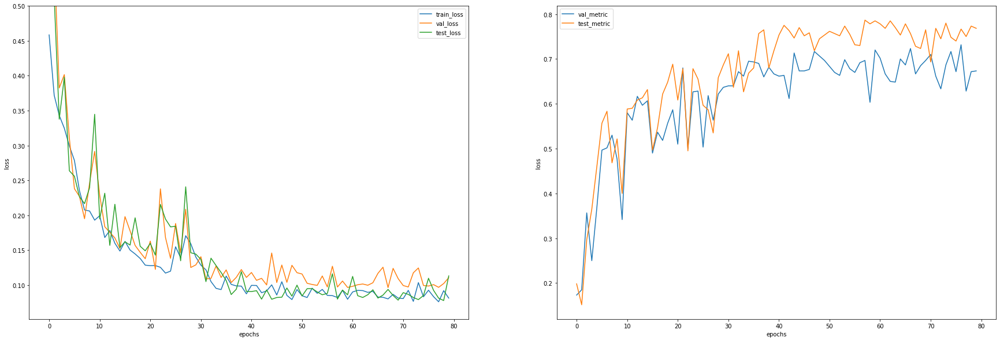

In [33]:
tr, val, test, valm, testm = unet_dice[0],unet_dice[1],unet_dice[2],unet_dice[3],unet_dice[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [34]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.731667, max test_metric: 0.786667


## UNet, Tversky, batchsize = 8

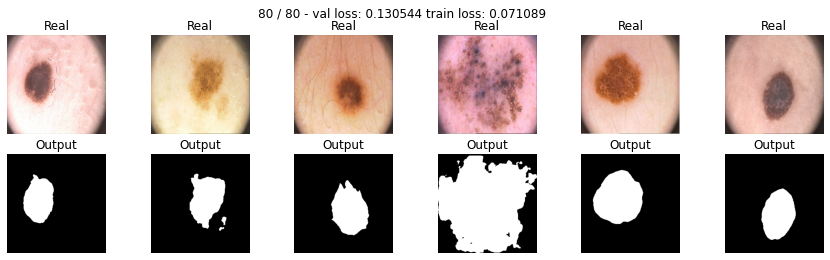

In [31]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_tversky = train(unet_model, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

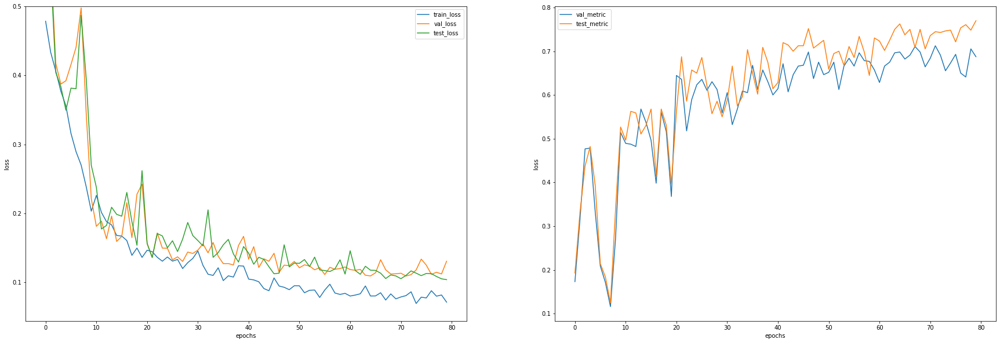

In [33]:
tr, val, test, valm, testm = unet_tversky[0],unet_tversky[1],unet_tversky[2],unet_tversky[3],unet_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [35]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.731667, max test_metric: 0.786667


## UNet, Tversky, batchsize=12

In [0]:
unet_model = UNet().to(device)

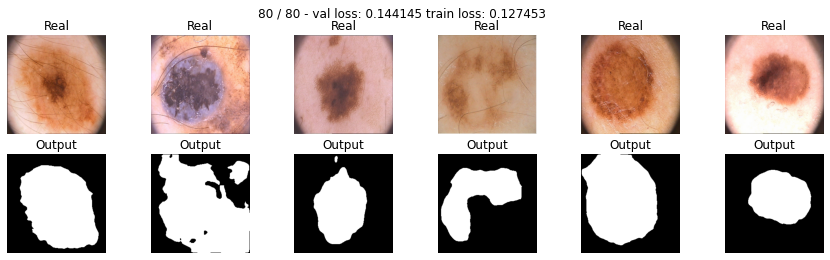

In [39]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_tversky = train(unet_model, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

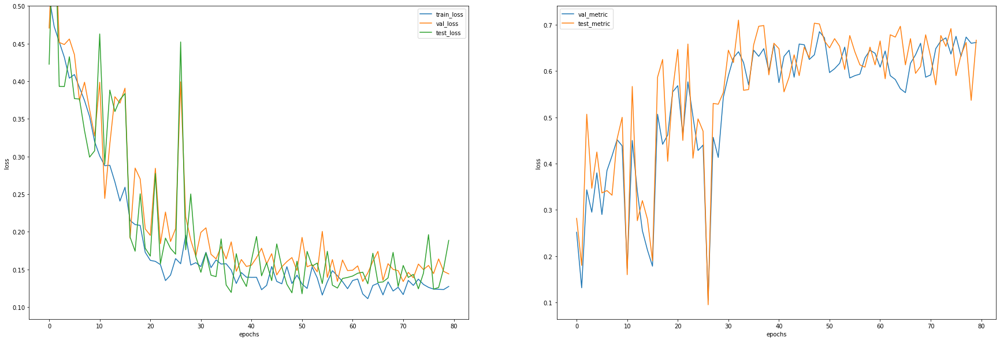

In [40]:
tr, val, test, valm, testm = unet_tversky[0],unet_tversky[1],unet_tversky[2],unet_tversky[3],unet_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [41]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.685000, max test_metric: 0.710000


## UNet, Focal, batchsize = 8

In [0]:
unet_model = UNet().to(device)

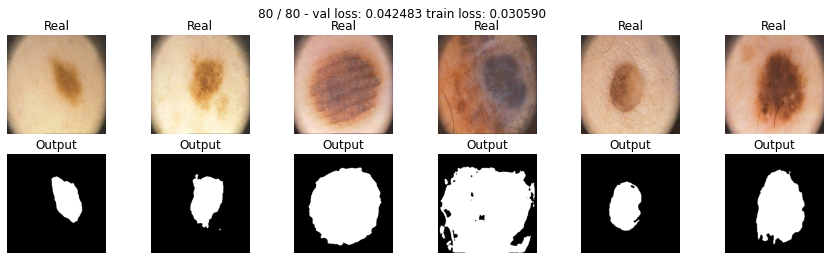

In [26]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_focal = train(unet_model, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

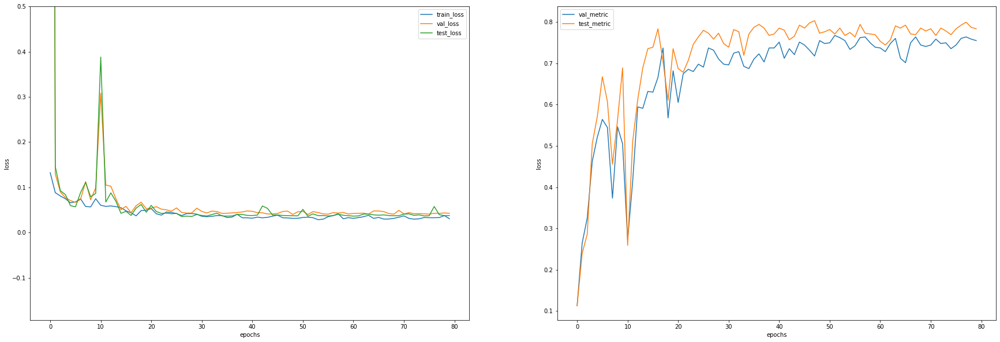

In [27]:
tr, val, test, valm, testm = unet_focal[0],unet_focal[1],unet_focal[2],unet_focal[3],unet_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.767857, max test_metric: 0.803571


## UNet, Focal, batchsize = 12

In [0]:
unet_model = UNet().to(device)

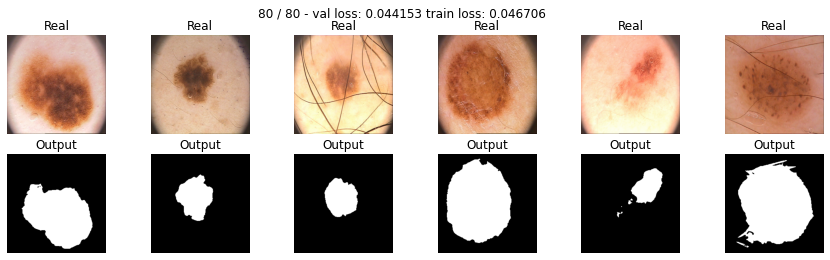

In [26]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001,)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_focal = train(unet_model, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

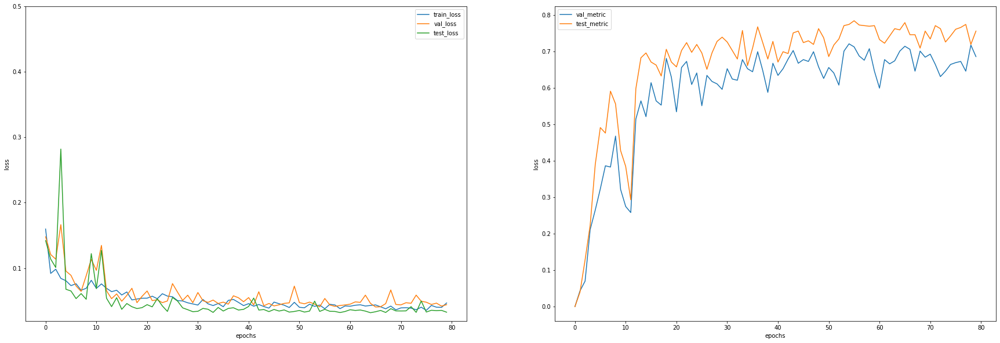

In [27]:
tr, val, test, valm, testm = unet_focal[0],unet_focal[1],unet_focal[2],unet_focal[3],unet_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.721667, max test_metric: 0.785000


## UNet, Combo, batchsize = 8

In [0]:
unet_model = UNet().to(device)

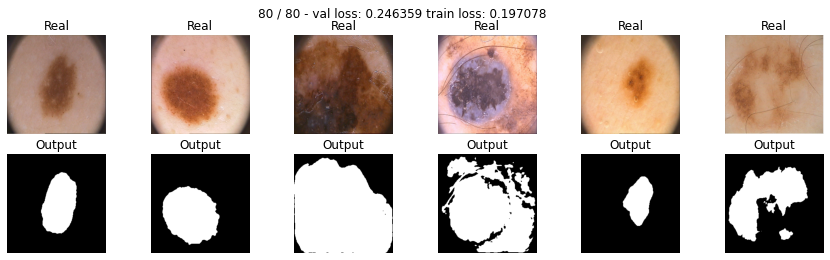

In [26]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_combo = train(unet_model, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

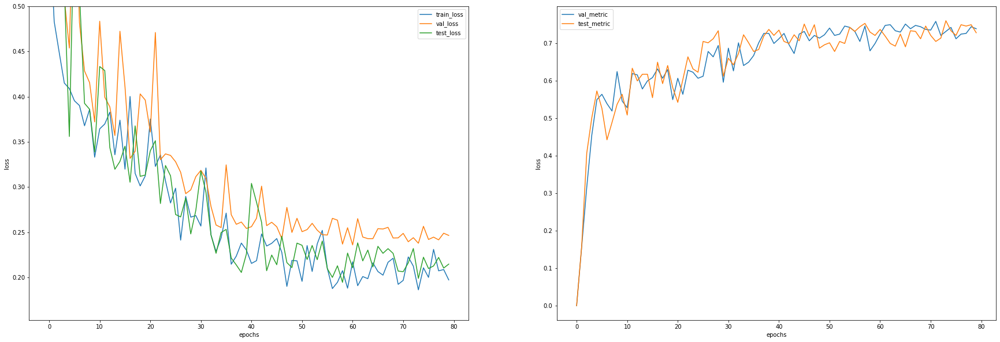

In [27]:
tr, val, test, valm, testm = unet_combo[0],unet_combo[1],unet_combo[2],unet_combo[3],unet_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.758929, max test_metric: 0.760714


## UNet, Combo, batchsize = 12

In [0]:
unet_model = UNet().to(device)

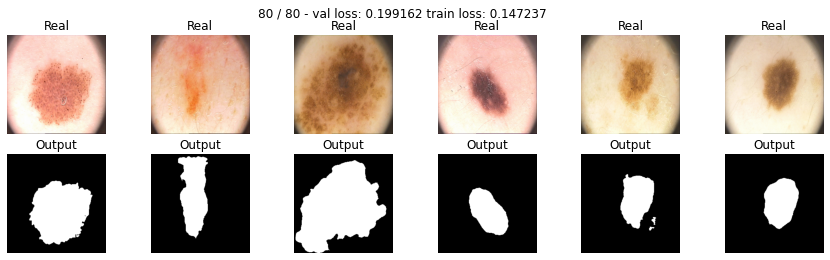

In [31]:
max_epochs = 80
optim = torch.optim.Adam(unet_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet_combo = train(unet_model, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

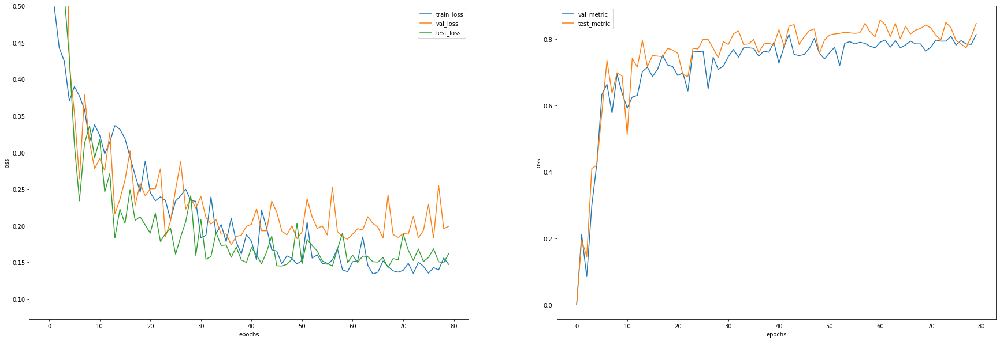

In [32]:
tr, val, test, valm, testm = unet_combo[0],unet_combo[1],unet_combo[2],unet_combo[3],unet_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [33]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.813333, max test_metric: 0.856667


# UNet2

Новая модель путем изменения типа пулинга:

 **Max-Pooling** for the downsampling and **nearest-neighbor Upsampling** for the upsampling.

Down-sampling:

        conv = nn.Conv2d(3, 64, 3, padding=1)
        pool = nn.MaxPool2d(3, 2, padding=1)

Up-Sampling

        upsample = nn.Upsample(32)
        conv = nn.Conv2d(64, 64, 3, padding=1)

Замените max-pooling на convolutions с stride=2 и upsampling на transpose-convolutions с stride=2.


In [0]:
class UNet2(nn.Module):
    def __init__(self):
        super().__init__()                  
        
        # encoder (downsampling)
        self.enc_conv0_1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_1 = nn.BatchNorm2d(64)
        self.enc_conv0_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_2 = nn.BatchNorm2d(64)
        self.enc_conv0_3 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=2, padding=(1, 1))
        self.bn0_3 = nn.BatchNorm2d(64)  # 256 -> 128      
        
        self.enc_conv1_1 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_1 = nn.BatchNorm2d(128)
        self.enc_conv1_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_2 = nn.BatchNorm2d(128)
        self.enc_conv1_3 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=2, padding=(1, 1))
        self.bn1_3 = nn.BatchNorm2d(128) # 128 -> 64
        
        self.enc_conv2_1 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_1 = nn.BatchNorm2d(256)
        self.enc_conv2_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_2 = nn.BatchNorm2d(256) 
        self.enc_conv2_3 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=2, padding=(1, 1))
        self.bn2_3 = nn.BatchNorm2d(256) # 64 -> 32

        self.enc_conv3_1 = nn.Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_1 = nn.BatchNorm2d(512)
        self.enc_conv3_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_2 = nn.BatchNorm2d(512)
        self.enc_conv3_3 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=2, padding=(1, 1))
        self.bn3_3 = nn.BatchNorm2d(512) # 32 -> 16

        # bottleneck
        self.bottleneck_conv1 = nn.Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn1 = nn.BatchNorm2d(1024)
        self.bottleneck_conv2 = nn.Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn2 = nn.BatchNorm2d(1024)
        self.bottleneck_conv3 = nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=(1, 1))
        self.bottleneck_bn3 = nn.BatchNorm2d(512)

        # decoder (upsampling)
        # self.upsample0 =  # 16 -> 32
        self.dec_conv0_1 = nn.Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_1 = nn.BatchNorm2d(512)
        self.dec_conv0_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_2 = nn.BatchNorm2d(512)
        self.dec_conv0_3 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=(1, 1))
        self.dec_bn0_3 = nn.BatchNorm2d(256)
        
        self.dec_conv1_1 = nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_1 = nn.BatchNorm2d(256)
        self.dec_conv1_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_2 = nn.BatchNorm2d(256)
        self.dec_conv1_3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=(1, 1))
        self.dec_bn1_3 = nn.BatchNorm2d(128)

        self.dec_conv2_1 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_1 = nn.BatchNorm2d(128)
        self.dec_conv2_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_2 = nn.BatchNorm2d(128)
        self.dec_conv2_3 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=(1, 1))
        self.dec_bn2_3 = nn.BatchNorm2d(64)


        self.dec_conv3_1 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_1 = nn.BatchNorm2d(64)
        self.dec_conv3_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_2 = nn.BatchNorm2d(64)
        self.dec_conv3_3 = nn.Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))       

    def forward(self, x):
        # encoder
        e0_1 = F.relu(self.bn0_2(self.enc_conv0_2(F.relu(self.bn0_1(self.enc_conv0_1(x))))))
        e0_2 = F.relu(self.bn0_3(self.enc_conv0_3(e0_1))) #2strided

        e1_1 = F.relu(self.bn1_2(self.enc_conv1_2(F.relu(self.bn1_1(self.enc_conv1_1(e0_2))))))
        e1_2 = F.relu(self.bn1_3(self.enc_conv1_3(e1_1))) #2strided

        e2_1 = F.relu(self.bn2_2(self.enc_conv2_2(F.relu(self.bn2_1(self.enc_conv2_1(e1_2))))))
        e2_2 = F.relu(self.bn2_3(self.enc_conv2_3(e2_1))) #2strided

        e3_1 = F.relu(self.bn3_2(self.enc_conv3_2(F.relu(self.bn3_1(self.enc_conv3_1(e2_2))))))
        e3_2 = F.relu(self.bn3_3(self.enc_conv3_3(e3_1))) #2strided
               
        # bottleneck
        b = F.relu(self.bottleneck_bn2(self.bottleneck_conv2(F.relu(self.bottleneck_bn1(self.bottleneck_conv1(e3_2))))))
        b1 = F.relu(self.bottleneck_bn3(self.bottleneck_conv3(b,output_size=torch.Size([10, 512, 32, 32]))))               

        # decoder
        d0_1 = F.relu(self.dec_bn0_2(self.dec_conv0_2(F.relu(self.dec_bn0_1(self.dec_conv0_1(
            torch.cat([e3_1,b1],dim=1)))))))
        d0_2 = F.relu(self.dec_bn0_3(self.dec_conv0_3(d0_1,output_size=torch.Size([10, 512, 64, 64]))))
        
        d1_1 = F.relu(self.dec_bn1_2(self.dec_conv1_2(F.relu(self.dec_bn1_1(self.dec_conv1_1(
            torch.cat([e2_1,d0_2],dim=1)))))))
        d1_2 = F.relu(self.dec_bn1_3(self.dec_conv1_3(d1_1,output_size=torch.Size([10, 512, 128, 128]))))

        d2_1 = F.relu(self.dec_bn2_2(self.dec_conv2_2(F.relu(self.dec_bn2_1(self.dec_conv2_1(
            torch.cat([e1_1,d1_2],dim=1)))))))
        d2_2 = F.relu(self.dec_bn2_3(self.dec_conv2_3(d2_1,output_size=torch.Size([10, 512, 256, 256]))))

        d3 = self.dec_conv3_3(F.relu(self.dec_bn3_2(self.dec_conv3_2(F.relu(self.dec_bn3_1(self.dec_conv3_1(
            torch.cat([e0_1,d2_2],dim=1))))))))   
               
        # no activation
        return d3

## Unet2, BCE, batchsize = 8

In [0]:
unet2_model = UNet2().to(device)

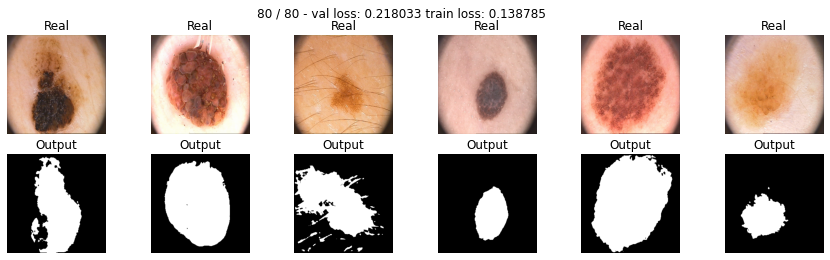

In [25]:
max_epochs = 80
optim = torch.optim.Adam(unet2_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet2_bce = train(unet2_model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

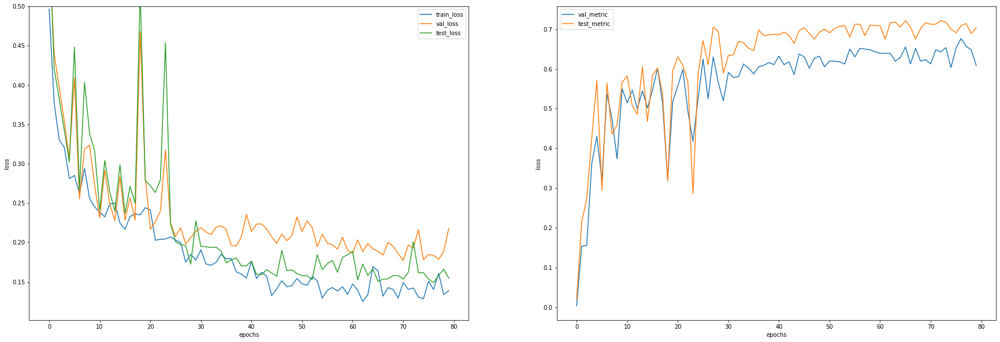

In [26]:
tr, val, test, valm, testm = unet2_bce[0],unet2_bce[1],unet2_bce[2],unet2_bce[3],unet2_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.676786, max test_metric: 0.721429


## Unet2, Dice, batchsize = 8

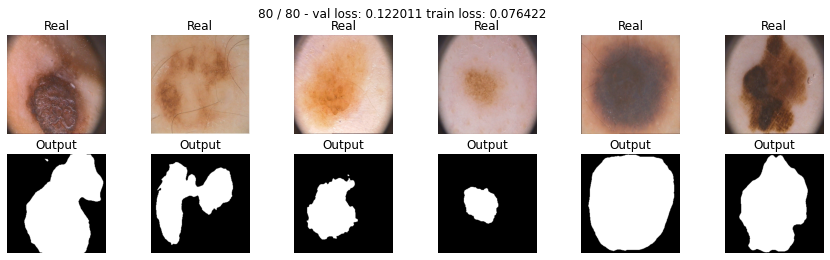

In [27]:
max_epochs = 80
optim = torch.optim.Adam(unet2_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet2_dice = train(unet2_model, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

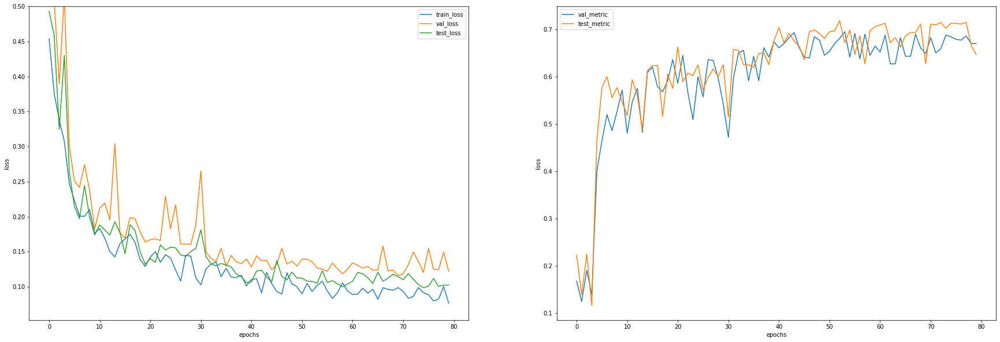

In [28]:
tr, val, test, valm, testm = unet2_dice[0],unet2_dice[1],unet2_dice[2],unet2_dice[3],unet2_dice[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [29]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.694643, max test_metric: 0.717857


## Unet2, Tversky, batchsize = 8

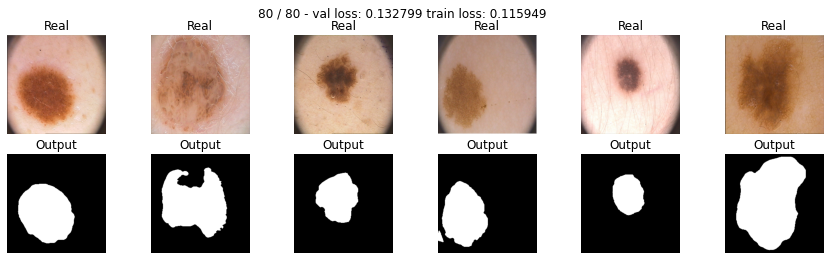

In [31]:
max_epochs = 80
optim = torch.optim.Adam(unet2_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet2_tversky = train(unet2_model, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

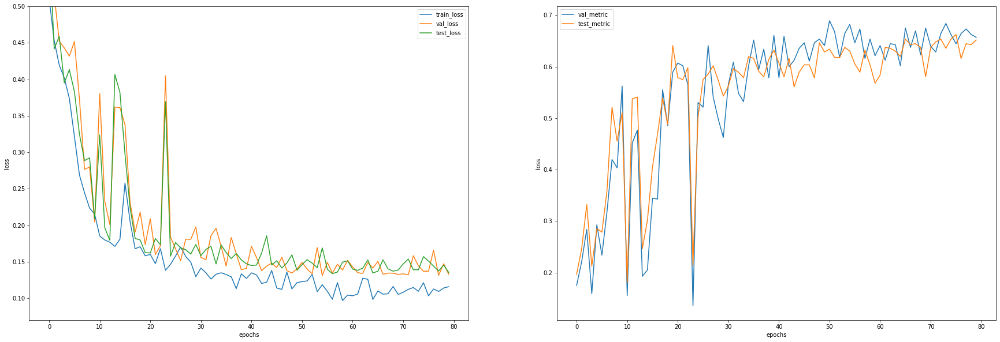

In [32]:
tr, val, test, valm, testm = unet2_tversky[0],unet2_tversky[1],unet2_tversky[2],unet2_tversky[3],unet2_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [33]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.689286, max test_metric: 0.662500


## Unet2, Focal, batchsize = 8

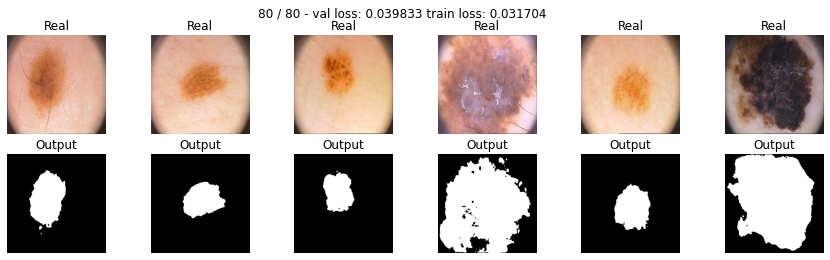

In [30]:
max_epochs = 80
optim = torch.optim.Adam(unet2_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet2_focal= train(unet2_model, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

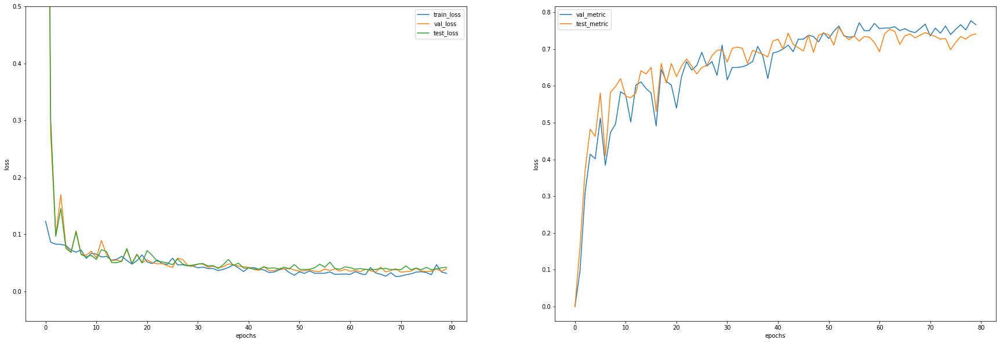

In [31]:
tr, val, test, valm, testm = unet2_focal[0],unet2_focal[1],unet2_focal[2],unet2_focal[3],unet2_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [32]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.776786, max test_metric: 0.758929


## Unet2, Combo, batchsize = 8

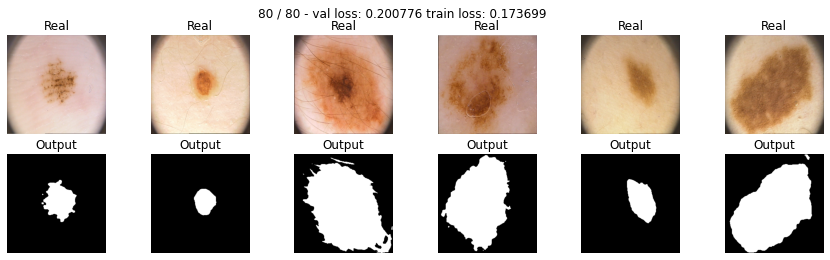

In [26]:
max_epochs = 80
optim = torch.optim.Adam(unet2_model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
unet2_combo= train(unet2_model, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

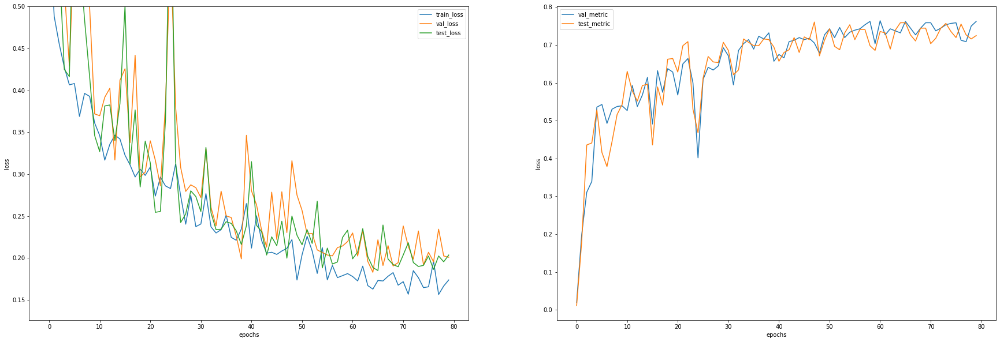

In [27]:
tr, val, test, valm, testm = unet2_combo[0],unet2_combo[1],unet2_combo[2],unet2_combo[3],unet2_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.764286, max test_metric: 0.760714


Сделайте вывод какая из моделей лучше

# Dilated convolutions [1 балл]



Еще один из вариантов делать upsampling и downsampling - использовать для этого *dilated convolutions*:


* Yu, Fisher, and Vladlen Koltun. "[Multi-scale context aggregation by dilated convolutions.](https://arxiv.org/pdf/1511.07122.pdf)" arXiv preprint arXiv:1511.07122 (2015).

попробуйте написать сеть DilatedUNet, которая использует в одной из предыдущих моделей dilated свертки.

In [0]:
class DilatedUNet(nn.Module):
    def __init__(self):
        super().__init__()

        # encoder (downsampling)
        self.enc_conv0_1 = nn.Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_1 = nn.BatchNorm2d(64)
        self.enc_conv0_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn0_2 = nn.BatchNorm2d(64)
        self.enc_conv0_3 = nn.Conv2d(64, 64, kernel_size=3, stride=2, padding=2, dilation=2)
        self.bn0_3 = nn.BatchNorm2d(64)  # 256 -> 128      
        
        self.enc_conv1_1 = nn.Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_1 = nn.BatchNorm2d(128)
        self.enc_conv1_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn1_2 = nn.BatchNorm2d(128)
        self.enc_conv1_3 = nn.Conv2d(128, 128, kernel_size=3, stride=2, padding=2, dilation=2)
        self.bn1_3 = nn.BatchNorm2d(128) # 128 -> 64
        
        self.enc_conv2_1 = nn.Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_1 = nn.BatchNorm2d(256)
        self.enc_conv2_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn2_2 = nn.BatchNorm2d(256) 
        self.enc_conv2_3 = nn.Conv2d(256, 256, kernel_size=3, stride=2, padding=2, dilation=2)
        self.bn2_3 = nn.BatchNorm2d(256) # 64 -> 32

        self.enc_conv3_1 = nn.Conv2d(256, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_1 = nn.BatchNorm2d(512)
        self.enc_conv3_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bn3_2 = nn.BatchNorm2d(512)
        self.enc_conv3_3 = nn.Conv2d(512, 512, kernel_size=3, stride=2, padding=2, dilation=2)
        self.bn3_3 = nn.BatchNorm2d(512) # 32 -> 16

        # bottleneck
        self.bottleneck_conv1 = nn.Conv2d(512, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn1 = nn.BatchNorm2d(1024)
        self.bottleneck_conv2 = nn.Conv2d(1024, 1024, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.bottleneck_bn2 = nn.BatchNorm2d(1024)
        self.bottleneck_conv3 = nn.ConvTranspose2d(1024, 512, kernel_size=3, stride=2, padding=2,dilation=2,output_padding=1)
        self.bottleneck_bn3 = nn.BatchNorm2d(512)

        # decoder (upsampling)
        # self.upsample0 =  # 16 -> 32
        self.dec_conv0_1 = nn.Conv2d(1024, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_1 = nn.BatchNorm2d(512)
        self.dec_conv0_2 = nn.Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn0_2 = nn.BatchNorm2d(512)
        self.dec_conv0_3 = nn.ConvTranspose2d(512, 256, kernel_size=3, stride=2, padding=2,dilation=2,output_padding=1)
        self.dec_bn0_3 = nn.BatchNorm2d(256)
        
        self.dec_conv1_1 = nn.Conv2d(512, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_1 = nn.BatchNorm2d(256)
        self.dec_conv1_2 = nn.Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn1_2 = nn.BatchNorm2d(256)
        self.dec_conv1_3 = nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=2,dilation=2,output_padding=1)
        self.dec_bn1_3 = nn.BatchNorm2d(128)

        self.dec_conv2_1 = nn.Conv2d(256, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_1 = nn.BatchNorm2d(128)
        self.dec_conv2_2 = nn.Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn2_2 = nn.BatchNorm2d(128)
        self.dec_conv2_3 = nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=2,dilation=2,output_padding=1)
        self.dec_bn2_3 = nn.BatchNorm2d(64)


        self.dec_conv3_1 = nn.Conv2d(128, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_1 = nn.BatchNorm2d(64)
        self.dec_conv3_2 = nn.Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        self.dec_bn3_2 = nn.BatchNorm2d(64)
        self.dec_conv3_3 = nn.Conv2d(64, 1, kernel_size=(1, 1), stride=(1, 1))       

    def forward(self, x):
        # encoder
        e0_1 = F.relu(self.bn0_2(self.enc_conv0_2(F.relu(self.bn0_1(self.enc_conv0_1(x))))))
        #print(e0_1.size()) 
        e0_2 = F.relu(self.bn0_3(self.enc_conv0_3(e0_1))) #2strided

        e1_1 = F.relu(self.bn1_2(self.enc_conv1_2(F.relu(self.bn1_1(self.enc_conv1_1(e0_2))))))
        #print(e1_1.size()) 
        e1_2 = F.relu(self.bn1_3(self.enc_conv1_3(e1_1))) #2strided

        e2_1 = F.relu(self.bn2_2(self.enc_conv2_2(F.relu(self.bn2_1(self.enc_conv2_1(e1_2))))))
        #print(e2_1.size())        
        e2_2 = F.relu(self.bn2_3(self.enc_conv2_3(e2_1))) #2strided

        e3_1 = F.relu(self.bn3_2(self.enc_conv3_2(F.relu(self.bn3_1(self.enc_conv3_1(e2_2))))))
        #print(e3_1.size())
        e3_2 = F.relu(self.bn3_3(self.enc_conv3_3(e3_1))) #2strided
               
        # bottleneck
        b = F.relu(self.bottleneck_bn2(self.bottleneck_conv2(F.relu(self.bottleneck_bn1(self.bottleneck_conv1(e3_2))))))
        #print(b.size())
        b1 = F.relu(self.bottleneck_bn3(self.bottleneck_conv3(b)))               
        #print(b1.size())
        # decoder
        d0_1 = F.relu(self.dec_bn0_2(self.dec_conv0_2(F.relu(self.dec_bn0_1(self.dec_conv0_1(
            torch.cat([e3_1,b1],dim=1)))))))
        d0_2 = F.relu(self.dec_bn0_3(self.dec_conv0_3(d0_1)))
        
        d1_1 = F.relu(self.dec_bn1_2(self.dec_conv1_2(F.relu(self.dec_bn1_1(self.dec_conv1_1(
            torch.cat([e2_1,d0_2],dim=1)))))))
        d1_2 = F.relu(self.dec_bn1_3(self.dec_conv1_3(d1_1)))

        d2_1 = F.relu(self.dec_bn2_2(self.dec_conv2_2(F.relu(self.dec_bn2_1(self.dec_conv2_1(
            torch.cat([e1_1,d1_2],dim=1)))))))
        d2_2 = F.relu(self.dec_bn2_3(self.dec_conv2_3(d2_1)))

        d3 = self.dec_conv3_3(F.relu(self.dec_bn3_2(self.dec_conv3_2(F.relu(self.dec_bn3_1(self.dec_conv3_1(
            torch.cat([e0_1,d2_2],dim=1))))))))   
               
        # no activation
        return d3

## DilatedUNet, BCE, batchsize = 8

In [0]:
model = DilatedUNet().to(device)

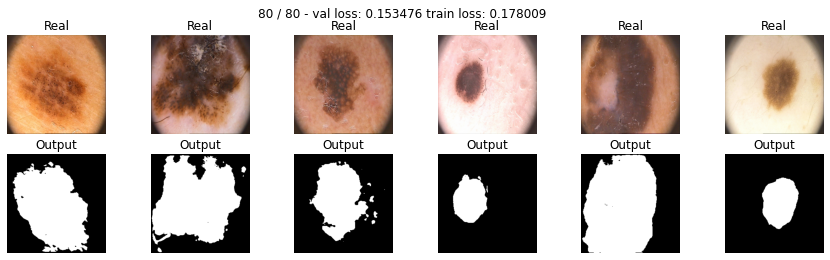

In [25]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
dilated_bce = train(model, optim, bce_loss, max_epochs, data_tr, data_val, data_ts, sched)

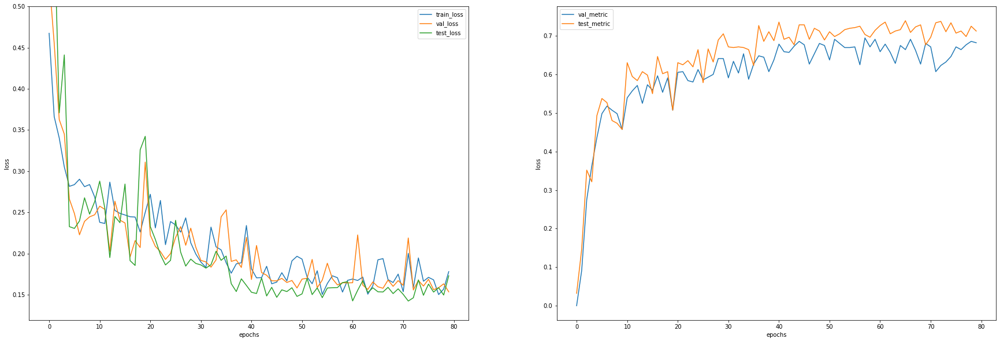

In [26]:
tr, val, test, valm, testm = dilated_bce[0],dilated_bce[1],dilated_bce[2],dilated_bce[3],dilated_bce[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [27]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.694643, max test_metric: 0.739286


## DilatedUNet, Focal, batchsize = 8

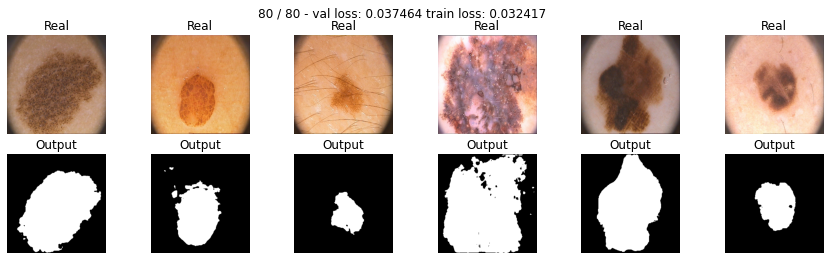

In [26]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
dilated_focal = train(model, optim, focal_loss, max_epochs, data_tr, data_val, data_ts, sched)

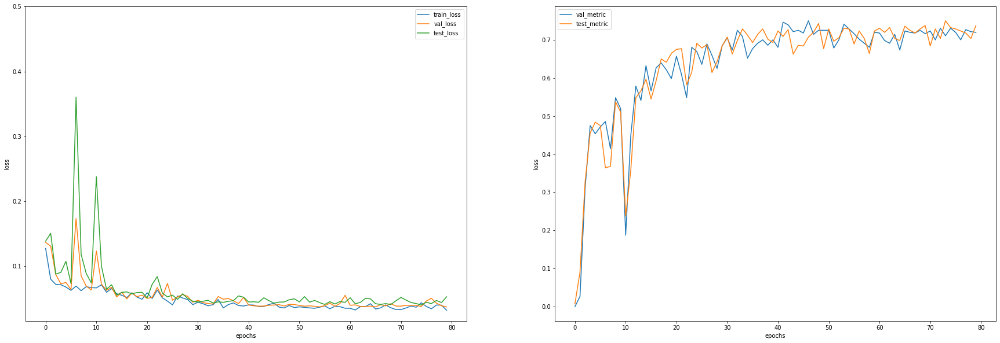

In [27]:
tr, val, test, valm, testm = dilated_focal[0],dilated_focal[1],dilated_focal[2],dilated_focal[3],dilated_focal[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [28]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.750000, max test_metric: 0.750000


## DilatedUNet, Tversky, batchsize = 8

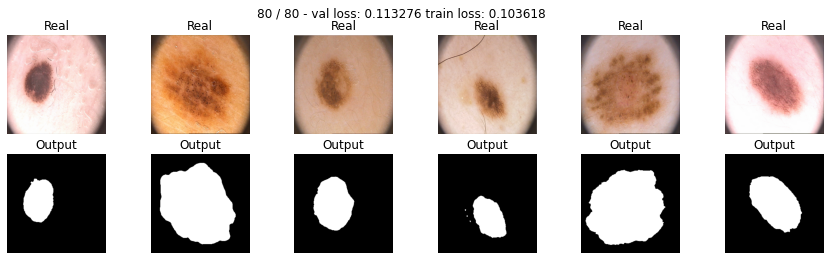

In [31]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
dilated_tversky = train(model, optim, tversky_loss, max_epochs, data_tr, data_val, data_ts, sched)

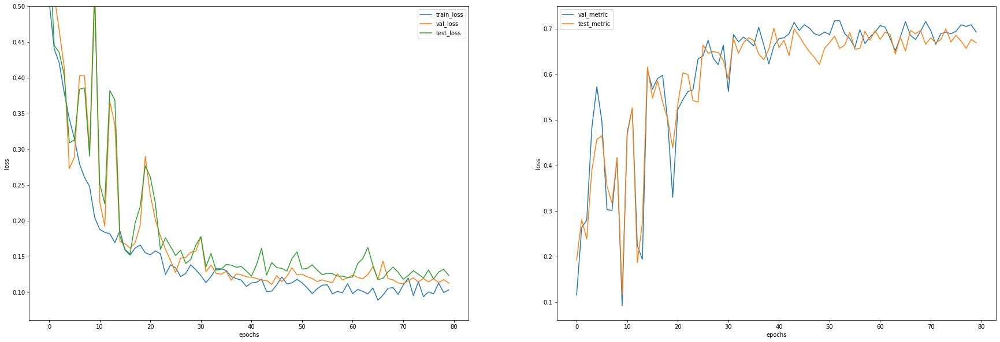

In [32]:
tr, val, test, valm, testm = dilated_tversky[0],dilated_tversky[1],dilated_tversky[2],dilated_tversky[3],dilated_tversky[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [33]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.717857, max test_metric: 0.701786


## DilatedUNet, Dice, batchsize = 8

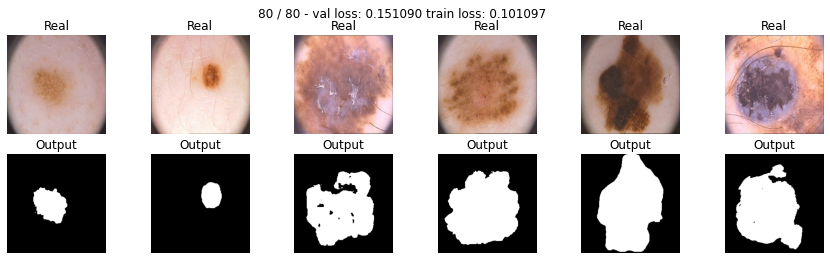

In [54]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
dilated_dice = train(model, optim, dice_loss, max_epochs, data_tr, data_val, data_ts, sched)

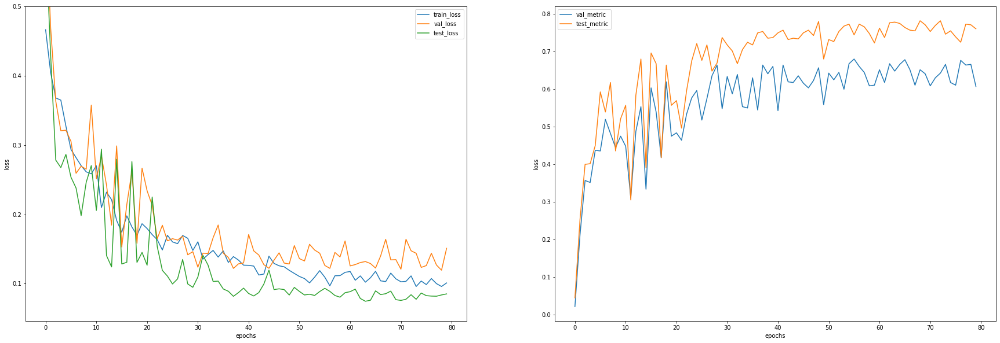

In [55]:
tr, val, test, valm, testm = dilated_dice[0],dilated_dice[1],dilated_dice[2],dilated_dice[3],dilated_dice[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [56]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.680357, max test_metric: 0.782143


## DilatedUNet, Combo, batchsize = 8

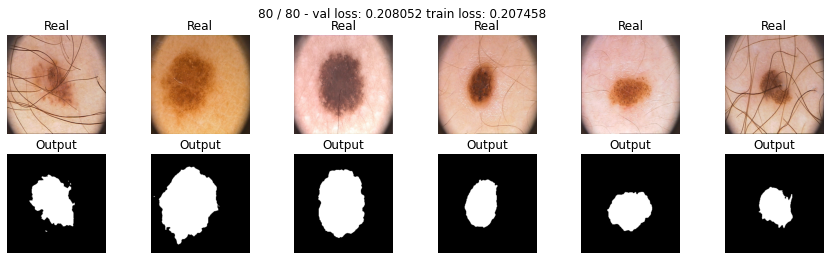

In [30]:
max_epochs = 80
optim = torch.optim.Adam(model.parameters(),lr=0.001)
sched = torch.optim.lr_scheduler.ReduceLROnPlateau(optim,factor=0.5,threshold=0.005, patience=3,verbose=True)
dilated_combo = train(model, optim, combo_loss, max_epochs, data_tr, data_val, data_ts, sched)

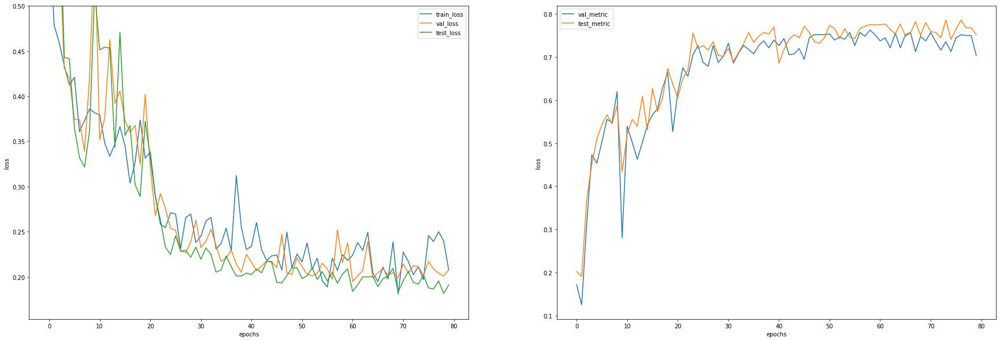

In [31]:
tr, val, test, valm, testm = dilated_combo[0],dilated_combo[1],dilated_combo[2],dilated_combo[3],dilated_combo[4]
plt.figure(figsize=(30, 10))
plt.subplot(1, 2, 1)
plt.plot(tr, label="train_loss")
plt.plot(val, label="val_loss")
plt.plot(test, label="test_loss")
plt.legend(loc='best')
plt.ylim(top=0.5)
plt.xlabel("epochs")
plt.ylabel("loss")
plt.subplot(1, 2, 2)
plt.plot(valm, label="val_metric")
plt.plot(testm, label="test_metric")
plt.legend(loc='best')
plt.xlabel("epochs")
plt.ylabel("loss")
plt.show()

In [32]:
print('Max val_metric: %f, max test_metric: %f' % (max(valm),max(testm)))

Max val_metric: 0.762500, max test_metric: 0.785714


# Отчет (5 баллов): 
Ниже предлагается написать отчет о проделанно работе и построить графики для лоссов, метрик на валидации и тесте. 

Аккуратно сравните модели между собой и соберите наилучшую архитектуру. Проверьте каждую модель с различными лоссами. Мы не ограничиваем вас в формате отчета, но проверябщий должен отчетливо понять для чего построен каждый график, какие выводы вы из него сделали и какой общий вывод можно сделать на основании данных моделей. Если вы захотите добавить что-то еще, чтобы увеличить шансы получения максимального балла, то добавляйте отдельное сравнение.



Отчет написан в readme.md репозитория